In [809]:
# Import libraries used for the Project
import numpy as np 
import pandas as pd
from scipy import stats
from scipy.stats import skew, kurtosis

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_selection import SelectKBest, chi2, mutual_info_classif


import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

Load the Data Set

In [733]:
# Create a Data Frame
df = pd.read_csv("./Australia Rainfall 2 SP6 2022.csv")

In [734]:
# Have a look if the data is loaded 
df.head(5)

# We can also see ? for missing values 

,State,Station,Year,Month,Date,Day,Min °C,Max °C,Rain(mm),Average Rain (mm),...,Dir - 9:00 AM - km/h,Spd - 9:00AM - km/h,MSLP- hPa - 9:00AM,Temp °C- 3:00PM,RH -% 3:00PM,Cld 8th- 3:00 PM,Dir - 3:00 PM - km/h,Spd - 3:00PM - km/h,MSLP- hPa - 3:00PM,Rain(Y/N)
0,ACT,Canberra Airport {station 070351},2019,May,1,We,6.5,20.8,0,1.9,...,NNW,6,1022,20.1,61,8,WNW,13,1021.3,N
1,ACT,Canberra Airport {station 070351},2019,May,2,Th,8.8,23.8,0,1.9,...,ESE,4,1026.6,22.4,57,8,NW,11,1022.5,N
2,ACT,Canberra Airport {station 070351},2019,May,3,Fr,15.2,20.4,20.8,1.9,...,NNW,24,1019.1,18.9,75,?,N,33,1015.8,Y
3,ACT,Canberra Airport {station 070351},2019,May,4,Sa,5,19,0.6,1.9,...,Calm,?,1018.1,16.6,47,2,WNW,22,1015.6,Y
4,ACT,Canberra Airport {station 070351},2019,May,5,Su,4.9,17.4,0,1.9,...,S,24,1021,14.9,58,8,S,33,1019.4,N


Split The Data

In [735]:
# Let's split the data on a 70%
df_70, df_30 = train_test_split(df, test_size=0.3, random_state=69)

# Look at shapes
print(df_70.shape)
print(df_30.shape)

# Use the variable DF again
df = df_70.copy()

(8293, 26)
(3555, 26)


Initial Data Summary

In [736]:
# Look at the DF shape
df.shape

(8293, 26)

In [737]:
# General information about each feature
df.info()

# I will need to change the data types to fully investigate the values and summaries of each feature

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8293 entries, 9266 to 7371
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   State                     8293 non-null   object 
 1   Station                   8293 non-null   object 
 2   Year                      8293 non-null   int64  
 3   Month                     8293 non-null   object 
 4   Date                      8293 non-null   object 
 5   Day                       8293 non-null   object 
 6   Min °C                    8293 non-null   object 
 7   Max °C                    8293 non-null   object 
 8   Rain(mm)                  8293 non-null   object 
 9   Average Rain (mm)         8293 non-null   float64
 10  Max Wind gust Dir         8293 non-null   object 
 11  Max wind gust Spd - km/h  8293 non-null   object 
 12  Max wind gust-Time-local  8293 non-null   object 
 13  Temp °C- 9:00AM           8293 non-null   object 
 14  RH -%

Initial Transformation

In [738]:
# First I will change the names, to long and hard to work with
df.columns

Index(['State', 'Station', 'Year', 'Month', 'Date', 'Day', 'Min °C', 'Max °C',
       'Rain(mm)', 'Average Rain (mm)', 'Max Wind gust Dir',
       'Max wind gust Spd - km/h', 'Max wind gust-Time-local',
       'Temp °C- 9:00AM', 'RH -% 9:00AM', 'Cld 8th- 9:00 AM',
       'Dir - 9:00 AM - km/h', 'Spd - 9:00AM - km/h', 'MSLP- hPa - 9:00AM',
       'Temp °C- 3:00PM', 'RH -% 3:00PM', 'Cld 8th- 3:00 PM',
       'Dir - 3:00 PM - km/h', 'Spd - 3:00PM - km/h', 'MSLP- hPa - 3:00PM',
       'Rain(Y/N)'],
      dtype='object')

In [739]:
# New names 
new_col_names = ['State', 'Station', 'Year', 'Month', 'Date', 'Day', 'Min_Temp', 'Max_Temp',
       'Rain_mm', 'AVG_Rain_mm', 'Wind_Mx_Dir',
       'Wind_Mx_Spd', 'Wind_Mx_Tim',
       'Temp_9am', 'RH_9am', 'Cld_9am',
       'Wind_Dir_9am', 'Wind_Spd_9am', 'MSLP_9am',
       'Temp_3pm', 'RH_3pm', 'Cld_3pm',
       'Wind_Dir_3pm', 'Wind_Spd_3pm', 'MSLP_3pm',
       'Rain']

# Change column names
df.columns = new_col_names

In [740]:
# Now we will replace the missing values for a numpy Nan
df.replace("?", np.nan, inplace=True)

In [741]:
# Create a function that will identify if the variable is Object, Integer or Float and convert it
def convert_dtype(feature):
    try:
        return pd.to_numeric(feature)
    except:
            return feature

In [742]:
# Transform Wind_Mx_Tim to time if required
# I'm leaving this if it will be helpful later on the project or for further analysis
df["Wind_Mx_Tim"] = df.apply(lambda x: x.Wind_Mx_Tim if pd.isna(x.Wind_Mx_Tim) else x.Date + "-" + x.Month + "-" + str(x.Year) + " " + x.Wind_Mx_Tim +":00", axis=1)
df["Wind_Mx_Tim"] = pd.to_datetime(df["Wind_Mx_Tim"])

# For the remaining I will keep only the hour for the feature
df["Wind_Mx_Tim"] = df["Wind_Mx_Tim"].dt.hour

# Transform the data types of the DF
df.loc[:, df.columns != "Wind_Mx_Tim"] = df.loc[:, df.columns != "Wind_Mx_Tim"].apply(convert_dtype)

# Check the new data types
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8293 entries, 9266 to 7371
Data columns (total 26 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   State         8293 non-null   object 
 1   Station       8293 non-null   object 
 2   Year          8293 non-null   int64  
 3   Month         8293 non-null   object 
 4   Date          8293 non-null   int64  
 5   Day           8293 non-null   object 
 6   Min_Temp      8213 non-null   float64
 7   Max_Temp      8183 non-null   float64
 8   Rain_mm       8163 non-null   float64
 9   AVG_Rain_mm   8293 non-null   float64
 10  Wind_Mx_Dir   7557 non-null   object 
 11  Wind_Mx_Spd   7557 non-null   float64
 12  Wind_Mx_Tim   7562 non-null   float64
 13  Temp_9am      8236 non-null   float64
 14  RH_9am        8224 non-null   float64
 15  Cld_9am       4211 non-null   float64
 16  Wind_Dir_9am  8228 non-null   object 
 17  Wind_Spd_9am  7627 non-null   float64
 18  MSLP_9am      7409 non-nu

Continue Data Summary

In [743]:
# Collect the non-numeric features of the data set
non_numeric = []
numeric = []

# Add the valus in a for loop
for col in df:
    if df[col].dtypes == "object":
        non_numeric.append(col)
    else:
        numeric.append(col)

# Let's see what we have
print("Non-Numeric", non_numeric)
print("Numeric", numeric)

Non-Numeric ['State', 'Station', 'Month', 'Day', 'Wind_Mx_Dir', 'Wind_Dir_9am', 'Wind_Dir_3pm', 'Rain']
Numeric ['Year', 'Date', 'Min_Temp', 'Max_Temp', 'Rain_mm', 'AVG_Rain_mm', 'Wind_Mx_Spd', 'Wind_Mx_Tim', 'Temp_9am', 'RH_9am', 'Cld_9am', 'Wind_Spd_9am', 'MSLP_9am', 'Temp_3pm', 'RH_3pm', 'Cld_3pm', 'Wind_Spd_3pm', 'MSLP_3pm']


In [744]:
# Create an interval variable for the invertval features
interval = ['Min_Temp', 'Max_Temp', 'Rain_mm', 'AVG_Rain_mm', 'Wind_Mx_Spd', 
            'Temp_9am', 'RH_9am', 'Wind_Spd_9am', 'MSLP_9am', 'Temp_3pm', 'RH_3pm', 'Wind_Spd_3pm', 'MSLP_3pm']

In [745]:
# Get the skewness of each Feature
df[interval].skew().round(2)

Min_Temp         0.18
Max_Temp         0.33
Rain_mm         12.83
AVG_Rain_mm      0.00
Wind_Mx_Spd      0.88
Temp_9am         0.29
RH_9am          -0.54
Wind_Spd_9am     1.07
MSLP_9am        -0.06
Temp_3pm         0.32
RH_3pm          -0.07
Wind_Spd_3pm     0.65
MSLP_3pm         0.07
dtype: float64

In [746]:
# Get Kurtosis of each feature
df[interval].kurtosis().round(2)

Min_Temp         -0.54
Max_Temp         -0.61
Rain_mm         269.38
AVG_Rain_mm       0.00
Wind_Mx_Spd       1.57
Temp_9am         -0.61
RH_9am           -0.14
Wind_Spd_9am      2.99
MSLP_9am          0.29
Temp_3pm         -0.60
RH_3pm           -0.62
Wind_Spd_3pm      0.59
MSLP_3pm         -0.03
dtype: float64

In [747]:
# After transforming the variables now we can look at the Summary statistic of the numerical features
df[interval].describe().round(2).transpose()

,count,mean,std,min,25%,50%,75%,max
Min_Temp,8213.0,12.53,7.13,-5.9,7.40,12.0,17.6,30.6
Max_Temp,8183.0,23.70,7.57,5.7,17.50,23.0,29.5,48.9
Rain_mm,8163.0,1.81,7.72,0.0,0.00,0.0,0.2,254.8
AVG_Rain_mm,8293.0,1.90,0.00,1.9,1.90,1.9,1.9,1.9
Wind_Mx_Spd,7557.0,39.43,13.66,9.0,30.00,37.0,48.0,120.0
Temp_9am,8236.0,17.43,7.29,-0.2,11.80,16.6,22.8,41.3
RH_9am,8224.0,66.21,21.17,4.0,54.00,68.0,81.0,100.0
Wind_Spd_9am,7627.0,14.92,8.74,2.0,9.00,13.0,20.0,111.0
MSLP_9am,7409.0,1018.20,7.41,984.5,1013.30,1018.0,1023.1,1041.1
Temp_3pm,7681.0,22.29,7.54,3.7,16.20,21.7,28.0,48.2


In [748]:
# Let's look at the total missing values per feature
print(df.isnull().sum())

# Let's look at percentage of missing values per feature
print("------ Percent of Total Feature -----------")
df.isnull().sum().apply(lambda x: round(x/8293,2)).sort_values(ascending=False)

# From here we can identify that Cld_3pm and Cld_9am is missing above 50% of all values, they woould not be useful features

State              0
Station            0
Year               0
Month              0
Date               0
Day                0
Min_Temp          80
Max_Temp         110
Rain_mm          130
AVG_Rain_mm        0
Wind_Mx_Dir      736
Wind_Mx_Spd      736
Wind_Mx_Tim      731
Temp_9am          57
RH_9am            69
Cld_9am         4082
Wind_Dir_9am      65
Wind_Spd_9am     666
MSLP_9am         884
Temp_3pm         612
RH_3pm           623
Cld_3pm         4614
Wind_Dir_3pm     616
Wind_Spd_3pm     642
MSLP_3pm         891
Rain               0
dtype: int64
------ Percent of Total Feature -----------


Cld_3pm         0.56
Cld_9am         0.49
MSLP_9am        0.11
MSLP_3pm        0.11
Wind_Mx_Tim     0.09
Wind_Mx_Spd     0.09
Wind_Mx_Dir     0.09
RH_3pm          0.08
Wind_Spd_9am    0.08
Wind_Spd_3pm    0.08
Wind_Dir_3pm    0.07
Temp_3pm        0.07
Rain_mm         0.02
Max_Temp        0.01
Min_Temp        0.01
RH_9am          0.01
Wind_Dir_9am    0.01
Temp_9am        0.01
State           0.00
Station         0.00
AVG_Rain_mm     0.00
Day             0.00
Date            0.00
Month           0.00
Year            0.00
Rain            0.00
dtype: float64

In [749]:
# look at the values counts of each feature 
for col in df:
    print("------------------------------------------------")
    print("Feature:", col)
    print(df[col].value_counts())


# From here we can identify that AVG_Rain_mm has only one value, this is not a useful feature
# Also after investigating, Cld is a categorical ordinal variable 
# For the feature "Month", I can identify "Jun" and "June" we need to make one


------------------------------------------------
Feature: State
VIC    1209
QLD    1205
WA     1195
SA     1185
NSW    1165
NT      877
TAS     877
ACT     580
Name: State, dtype: int64
------------------------------------------------
Feature: Station
Brisbane {station 040913}                             308
Albury Airport AWS {station 072160}                   308
Broome Airport {station 003003}                       303
Gold Coast Seaway {station 040764}                    303
Bendigo Airport {station 081123}                      303
Alice Springs Airport {station 015590}                302
Albany {station 009500}                               301
North Shields (Port Lincoln AWS) {station 018192}     301
Renmark Aero {station 024048}                         300
Cairns Aero {station 031011}                          300
Perth Metro {station 009225}                          297
Adelaide (Kent Town) {station 023090}                 297
 Launceston (Ti Tree Bend) {station 091237}         

In [750]:
# First we replace Jun to June
df["Month"].replace("Jun", "June", inplace=True)

In [751]:
# I also want to further investigate the stations 
print(df[['State', 'Station']].groupby("State").value_counts())

# I can see that Ballarat has different values, I will have to merge them together to one
replacement = "Ballarat Aerodrome"
df['Station'] = df['Station'].apply(lambda x: replacement if x[:18] == replacement else x)

State  Station                                           
ACT    Canberra Airport {station 070351}                     294
       Tuggeranong (Isabella Plains) AWS {station 070339}    286
NSW    Sydney (Observatory Hill) {station 066062}            295
       Newcastle University {station 061390}                 293
       Bellambi AWS {station 068228}                         292
       Penrith Lakes AWS {station 067113                     285
NT     Alice Springs Airport {station 015590}                302
       Darwin Airport {station 014015}                       293
       Tennant Creek Airport {station 015135}                282
QLD    Brisbane {station 040913}                             308
       Gold Coast Seaway {station 040764}                    303
       Cairns Aero {station 031011}                          300
       Townsville Aero {station 032040}                      294
SA     North Shields (Port Lincoln AWS) {station 018192}     301
       Renmark Aero {station 024

In [763]:
# Unique number of values for all values excluding Na
df.nunique()


State             8
Station          28
Year              2
Month            12
Date             31
Day               7
Min_Temp        356
Max_Temp        377
Rain_mm         228
AVG_Rain_mm       1
Wind_Mx_Dir      16
Wind_Mx_Spd      57
Wind_Mx_Tim      24
Temp_9am        370
RH_9am           97
Cld_9am           9
Wind_Dir_9am     17
Wind_Spd_9am     34
MSLP_9am        441
Temp_3pm        379
RH_3pm           99
Cld_3pm           9
Wind_Dir_3pm     17
Wind_Spd_3pm     32
MSLP_3pm        415
Rain              2
dtype: int64

In [774]:
# Total number of unique values for non-interval excluding NA
df[df.columns[~df.columns.isin(interval)]].nunique()

State            8
Station         28
Year             2
Month           12
Date            31
Day              7
Wind_Mx_Dir     16
Wind_Mx_Tim     24
Cld_9am          9
Wind_Dir_9am    17
Cld_3pm          9
Wind_Dir_3pm    17
Rain             2
dtype: int64

Initial Visulisation

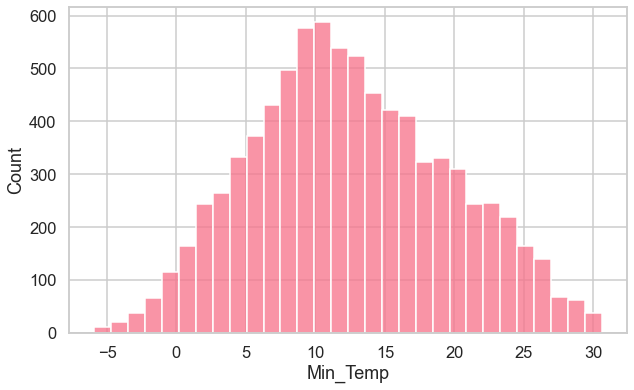

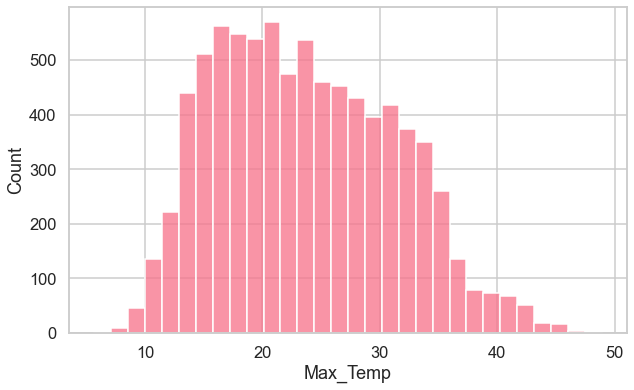

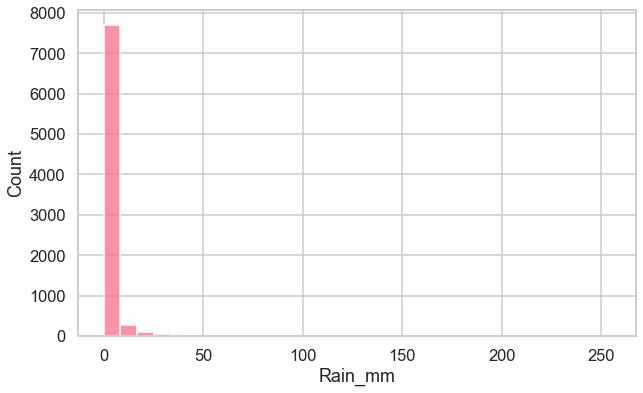

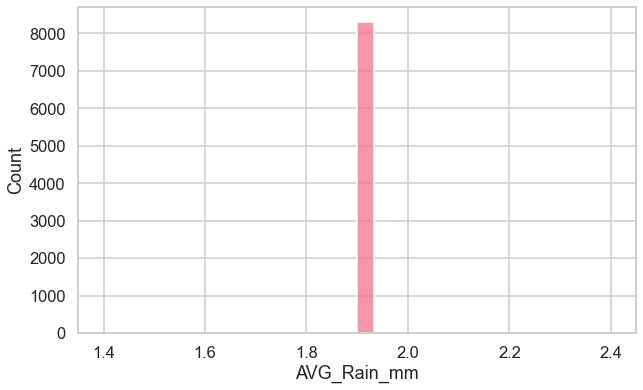

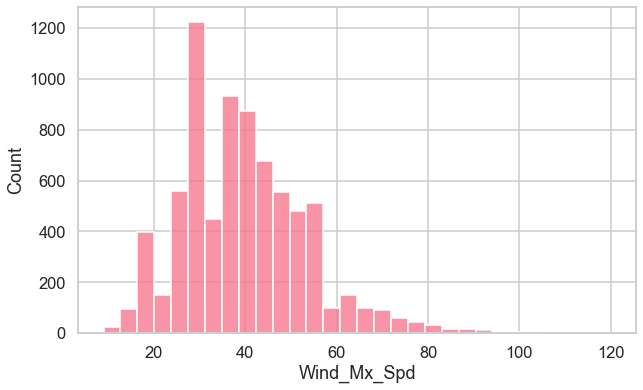

...

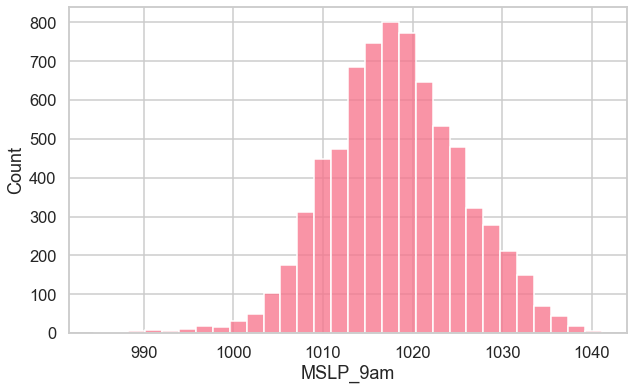

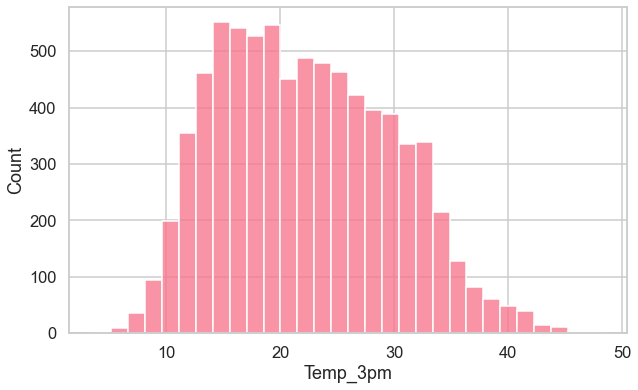

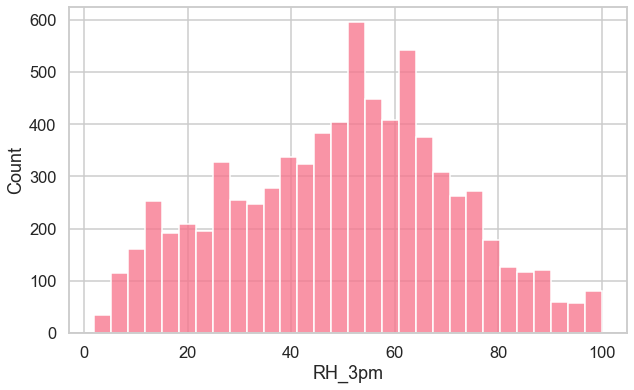

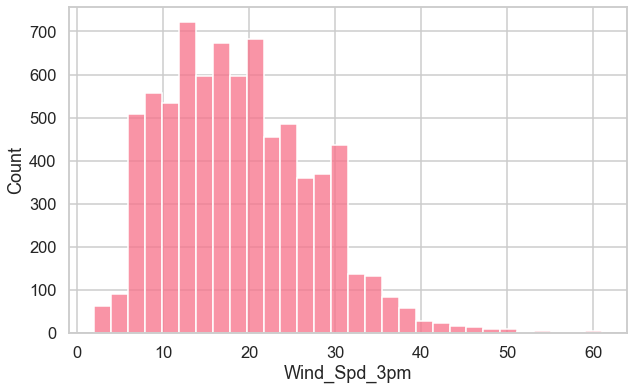

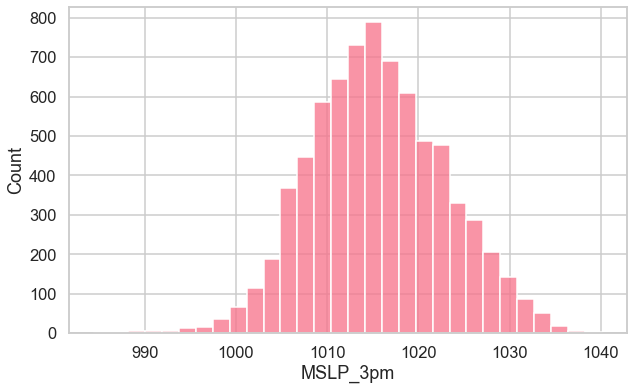

In [670]:
# Plot the Outcome of each individual feature
for feature in interval:
    sns.set_style("whitegrid")
    plt.figure(figsize=(10,6))
    sns.histplot(x=feature, data=df, bins=30)
    

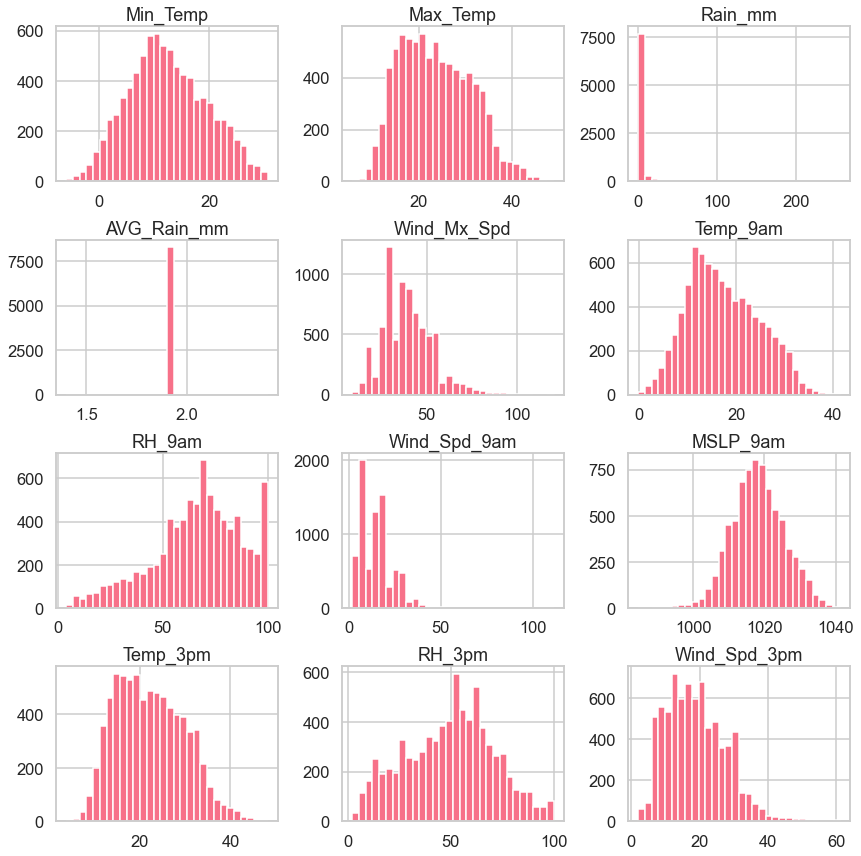

In [671]:
# Plot first 12 histograms in one page
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    ax.hist(df[interval[i]], bins=30)
    ax.set_title(f'{interval[i]}'.format(i+1))

# Adjust the spacing between subplots
fig.tight_layout()

# Display the plot
plt.show()


Feature Engeniering 

1.- Missing Values

In [775]:
# First let's make a copy from the current DF to a new clean version
df_clean = df.copy()

In [776]:
# First let's go to our missing values
# For the cloud direction features we have more than 1/3 of total values as NA, for this case I'm choosing at removing the feature
# To replace those featues it will create an educated estimate, but at the same time we are using that estimate to create another prediction
# Thats why I choose to eliminate them in this case
# I'm also going to remove "AVG_Rain_mm" as the feature is usless as only has one value
df_clean.drop(["Cld_9am", "Cld_3pm", "AVG_Rain_mm"], axis=1, inplace=True)
interval.remove("AVG_Rain_mm")



In [777]:
# Now lets revisit which features have missing values
# We know that they range from 8% to 1% of total values of the feature
print(df_clean.isnull().sum().sort_values(ascending=False))

# I will collect the name of the features
features_na = df_clean.isnull().sum()
features_na = features_na[features_na > 0].index
features_na

# We have a mixture of numerical and non numerical 

MSLP_3pm        891
MSLP_9am        884
Wind_Mx_Dir     736
Wind_Mx_Spd     736
Wind_Mx_Tim     731
Wind_Spd_9am    666
Wind_Spd_3pm    642
RH_3pm          623
Wind_Dir_3pm    616
Temp_3pm        612
Rain_mm         130
Max_Temp        110
Min_Temp         80
RH_9am           69
Wind_Dir_9am     65
Temp_9am         57
State             0
Station           0
Day               0
Date              0
Month             0
Year              0
Rain              0
dtype: int64


Index(['Min_Temp', 'Max_Temp', 'Rain_mm', 'Wind_Mx_Dir', 'Wind_Mx_Spd',
       'Wind_Mx_Tim', 'Temp_9am', 'RH_9am', 'Wind_Dir_9am', 'Wind_Spd_9am',
       'MSLP_9am', 'Temp_3pm', 'RH_3pm', 'Wind_Dir_3pm', 'Wind_Spd_3pm',
       'MSLP_3pm'],
      dtype='object')

In [779]:
# Lets look at the medina of the numerical featues, I'm choosing median as they are not normally distributed
print(df_clean[features_na].median())

# Let's see the change if we use the state 
print(df_clean.groupby("State")[features_na].median())

# We can see already see a difference for each state, let's take this further with each station
print(df_clean.groupby(["State","Station"])[features_na].median())

# Again this block creates further differences in how to hadle the NA values, 
# at the same time we can notice some particular stations might have more Na values like Newcastle University {station 061390}

Min_Temp          12.0
Max_Temp          23.0
Rain_mm            0.0
Wind_Mx_Spd       37.0
Wind_Mx_Tim       13.0
Temp_9am          16.6
RH_9am            68.0
Wind_Spd_9am      13.0
MSLP_9am        1018.0
Temp_3pm          21.7
RH_3pm            51.0
Wind_Spd_3pm      19.0
MSLP_3pm        1015.3
dtype: float64
       Min_Temp  Max_Temp  Rain_mm  Wind_Mx_Spd  Wind_Mx_Tim  Temp_9am  \
State                                                                    
ACT        5.45     18.70      0.0         38.0         13.0     11.35   
NSW       12.70     22.90      0.0         37.0         14.0     17.50   
NT        20.60     32.70      0.0         41.0         12.0     25.80   
QLD       19.40     27.90      0.0         35.0         13.0     23.90   
SA         9.80     19.80      0.0         39.0         13.0     14.10   
TAS        7.80     16.65      0.0         43.0         13.0     11.90   
VIC        8.10     17.80      0.0         37.0         13.0     11.60   
WA        13.80     

C:\Users\jmanu\AppData\Local\Temp\ipykernel_34324\311095657.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print(df_clean[features_na].median())


In [780]:
# Now I will look at how many NA we have per station, I will use the initila DF to find if Na values in the "Cld_9am" and "Cld_3pm" is recurrent in all stations
for station in df["Station"].unique():
    print(f"-------------{station}----------")
    print(df[df["Station"] == station].isnull().sum())

# First we see that "Cld_9am" and "Cld_3pm" has null values for most stations, I'm happy at excluding those features 
# Second we can see that "Newcastle University {station 061390}" and "Albany {station 009500}" have a great ammount of NA in most of their features
# Lets find the total number of samples for each station and compare with the total NA from previous table 
print(df_clean["Station"][(df_clean["Station"] == "Newcastle University {station 061390}") | (df_clean["Station"] == "Albany {station 009500}")].value_counts())

# We can see that both stations have NA values for most of their featues in all samples, no educated guess will bu sufficient to replace those NA values


-------------Broome Airport {station 003003}----------
State             0
Station           0
Year              0
Month             0
Date              0
Day               0
Min_Temp          1
Max_Temp          2
Rain_mm           3
AVG_Rain_mm       0
Wind_Mx_Dir       9
Wind_Mx_Spd       9
Wind_Mx_Tim       9
Temp_9am          2
RH_9am            2
Cld_9am         210
Wind_Dir_9am      2
Wind_Spd_9am      3
MSLP_9am          2
Temp_3pm          0
RH_3pm            0
Cld_3pm         250
Wind_Dir_3pm      0
Wind_Spd_3pm      0
MSLP_3pm          0
Rain              0
dtype: int64
-------------Renmark Aero {station 024048}----------
State             0
Station           0
Year              0
Month             0
Date              0
Day               0
Min_Temp          0
Max_Temp          2
Rain_mm           2
AVG_Rain_mm       0
Wind_Mx_Dir       3
Wind_Mx_Spd       3
Wind_Mx_Tim       3
Temp_9am          0
RH_9am            0
Cld_9am         300
Wind_Dir_9am      0
Wind_Spd_9am     14

In [781]:
# I want to look at how much of the total DF each of the last stations represent
df_clean["Station"].value_counts(normalize=True)

Ballarat Aerodrome                                    0.037502
Brisbane {station 040913}                             0.037140
Albury Airport AWS {station 072160}                   0.037140
Broome Airport {station 003003}                       0.036537
Gold Coast Seaway {station 040764}                    0.036537
Bendigo Airport {station 081123}                      0.036537
Alice Springs Airport {station 015590}                0.036416
Albany {station 009500}                               0.036296
North Shields (Port Lincoln AWS) {station 018192}     0.036296
Renmark Aero {station 024048}                         0.036175
Cairns Aero {station 031011}                          0.036175
Perth Metro {station 009225}                          0.035813
Adelaide (Kent Town) {station 023090}                 0.035813
Sydney (Observatory Hill) {station 066062}            0.035572
 Launceston (Ti Tree Bend) {station 091237}           0.035572
Canberra Airport {station 070351}                     0

In [782]:
# If we remove the last two stations, we will have a 7% reduction of the data but the data will be much cleaner, I will take that choice
# We will remove "Newcastle University {station 061390}" and "Albany {station 009500}"
df_clean = df_clean[(df_clean["Station"] != "Newcastle University {station 061390}") & (df_clean["Station"] != "Albany {station 009500}")]

In [783]:
# With the new DF let's look again at the missing values 
print("------ Percent of Total Feature -----------")
df_clean.isnull().sum().apply(lambda x: round(x/len(df_clean),2)).sort_values(ascending=False)

# For the remaining of the NA values, I will use the State as a blocking factor
# Interval will be replace with Median, as we don't have normally distributed features
# Categorical we will use the mode


------ Percent of Total Feature -----------


MSLP_3pm        0.08
MSLP_9am        0.08
Wind_Spd_9am    0.06
Wind_Mx_Tim     0.02
Wind_Mx_Dir     0.02
Wind_Mx_Spd     0.02
Wind_Spd_3pm    0.01
Max_Temp        0.01
Rain_mm         0.01
Wind_Dir_9am    0.00
Wind_Dir_3pm    0.00
RH_3pm          0.00
Temp_3pm        0.00
State           0.00
RH_9am          0.00
Temp_9am        0.00
Station         0.00
Min_Temp        0.00
Day             0.00
Date            0.00
Month           0.00
Year            0.00
Rain            0.00
dtype: float64

In [784]:
# Now we will use the State  to replace NA value
for state in df_clean.State.unique():
    for col in features_na:
       if col in interval:
          mean_val= round(df_clean.loc[df_clean["State"] == state, col].mean(), 2)
          df_clean.loc[df_clean["State"] == state, col] = df_clean.loc[df_clean["State"] == state, col].fillna(mean_val)
       else:
          mode_val = df_clean.loc[df_clean["State"] == state, col].mode()
          df_clean.loc[df_clean["State"] == state, col] = df_clean.loc[df_clean["State"] == state, col].fillna(mode_val[0])

In [785]:
# Lets look if we have any missing values
df_clean.isnull().sum()
 
# Yay

State           0
Station         0
Year            0
Month           0
Date            0
Day             0
Min_Temp        0
Max_Temp        0
Rain_mm         0
Wind_Mx_Dir     0
Wind_Mx_Spd     0
Wind_Mx_Tim     0
Temp_9am        0
RH_9am          0
Wind_Dir_9am    0
Wind_Spd_9am    0
MSLP_9am        0
Temp_3pm        0
RH_3pm          0
Wind_Dir_3pm    0
Wind_Spd_3pm    0
MSLP_3pm        0
Rain            0
dtype: int64

2.1 - Outliers 

In [786]:
# Now we want to look if we have any outliers on our numerical values
# Create a formula for that
def detect_outliers_iqr(data, factor=1.5):
    # Calculate the quartiles and IQR for each column in the DataFrame
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)
    iqr = q3 - q1

    # Find the upper and lower bounds for outlier detection
    upper_bound = q3 + factor * iqr
    lower_bound = q1 - factor * iqr

    # Identify the outliers for each column in the DataFrame
    outliers = {}
    for col in data.columns:
        outliers[col] = data.index[(data[col] > upper_bound[col]) | (data[col] < lower_bound[col])].tolist()

    return outliers


In [787]:
# Find the outliers presnet on the interval features
outliers = detect_outliers_iqr(df_clean[interval])

# Print the outliers
for col, outlier_indices in outliers.items():
    if len(outlier_indices) > 0:
        print(f"{col}: {len(outlier_indices)} outliers")

Max_Temp: 2 outliers
Rain_mm: 1469 outliers
Wind_Mx_Spd: 194 outliers
Temp_9am: 1 outliers
RH_9am: 70 outliers
Wind_Spd_9am: 182 outliers
MSLP_9am: 134 outliers
Temp_3pm: 3 outliers
Wind_Spd_3pm: 115 outliers
MSLP_3pm: 89 outliers


2.2 Log Transform

In [788]:
# We identified 10 features with outliers and 5 with more than a hundred each, a good way to add normality to those features will be
# with a Log transform, first lets make a copy of the DF and transform the features
df_int_Log = df_clean[interval].copy()

df_int_Log

,Min_Temp,Max_Temp,Rain_mm,Wind_Mx_Spd,Temp_9am,RH_9am,Wind_Spd_9am,MSLP_9am,Temp_3pm,RH_3pm,Wind_Spd_3pm,MSLP_3pm
9266,20.70,35.0,0.0,26.00,29.3,41.0,13.0,1011.10,32.4,40.0,19.0,1007.40
6840,13.50,15.2,7.8,33.00,14.0,92.0,17.0,1008.10,13.5,89.0,13.0,1006.90
3713,8.30,12.5,2.2,54.00,10.3,91.0,19.0,1013.10,12.2,84.0,26.0,1009.40
11612,27.70,42.4,0.0,54.00,35.1,25.0,11.0,1010.10,41.7,10.0,20.0,1006.30
5065,11.20,25.3,0.0,41.00,18.6,43.0,9.0,1022.70,24.5,50.0,24.0,1019.50
...,...,...,...,...,...,...,...,...,...,...,...,...
8631,21.20,39.7,0.0,59.00,32.9,9.0,17.0,1013.00,39.3,9.0,20.0,1010.00
9818,7.76,18.8,0.0,44.15,12.2,72.0,15.0,1015.32,18.0,42.0,13.0,1013.64
10859,19.50,32.3,0.0,52.00,26.5,38.0,17.0,1016.90,31.6,27.0,20.0,1012.10
4041,5.70,18.0,0.0,35.00,11.0,68.0,17.0,1024.30,16.7,45.0,17.0,1021.70


In [789]:
# Now we will transfor the features
df_int_Log = np.log1p(df_int_Log)

# We have some errors as we have 0 as value on Rain_mm and we have negative values on the minim temp
df_int_Log.isnull().sum()

# It could not be a big problem as Min_Temp feature didn't have outliers 

c:\Users\jmanu\anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: divide by zero encountered in log1p
  result = func(self.values, **kwargs)
c:\Users\jmanu\anaconda3\lib\site-packages\pandas\core\internals\blocks.py:402: RuntimeWarning: invalid value encountered in log1p
  result = func(self.values, **kwargs)


Min_Temp        136
Max_Temp          0
Rain_mm           0
Wind_Mx_Spd       0
Temp_9am          0
RH_9am            0
Wind_Spd_9am      0
MSLP_9am          0
Temp_3pm          0
RH_3pm            0
Wind_Spd_3pm      0
MSLP_3pm          0
dtype: int64

In [623]:
# We can run the function with the new transform data to find how many outliers we have now 
outliers = detect_outliers_iqr([interval])

# Print the outliers
for col, outlier_indices in outliers.items():
    if len(outlier_indices) > 0:
        print(f"{col}: {len(outlier_indices)} outliers")
        features.append(col)
        outlier.append(len(outlier_indices))

# It doesn't look gooddf_int_Log

Min_Temp: 309 outliers
Max_Temp: 3 outliers
Rain_mm: 1372 outliers
Wind_Mx_Spd: 162 outliers
Temp_9am: 111 outliers
RH_9am: 506 outliers
Wind_Spd_9am: 283 outliers
MSLP_9am: 129 outliers
Temp_3pm: 11 outliers
RH_3pm: 374 outliers
Wind_Spd_3pm: 157 outliers
MSLP_3pm: 82 outliers


In [790]:
# Look at statistics
df_int_Log.describe().round(2).transpose()

,count,mean,std,min,25%,50%,75%,max
Min_Temp,7563.0,-inf,NaN,-inf,2.14,2.57,2.94,3.45
Max_Temp,7699.0,3.16,0.32,1.90,2.91,3.19,3.42,3.91
Rain_mm,7699.0,0.39,0.81,0.00,0.00,0.00,0.34,5.54
Wind_Mx_Spd,7699.0,3.64,0.34,2.30,3.43,3.64,3.85,4.80
Temp_9am,7699.0,2.82,0.46,-0.22,2.54,2.87,3.18,3.74
RH_9am,7699.0,4.13,0.43,1.61,3.99,4.23,4.41,4.62
Wind_Spd_9am,7699.0,2.61,0.58,1.10,2.30,2.67,3.00,4.01
MSLP_9am,7699.0,6.93,0.01,6.89,6.92,6.93,6.93,6.95
Temp_3pm,7699.0,3.09,0.34,1.55,2.84,3.12,3.37,3.90
RH_3pm,7699.0,3.80,0.56,1.10,3.56,3.95,4.19,4.62


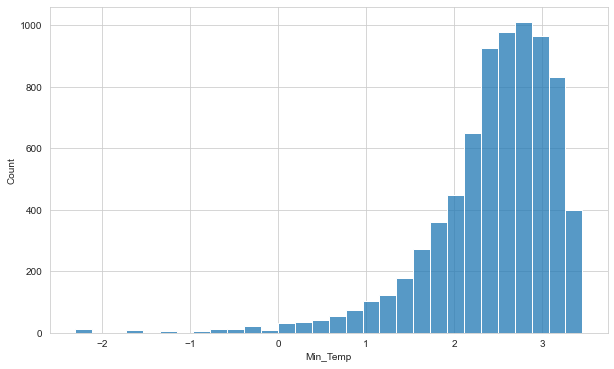

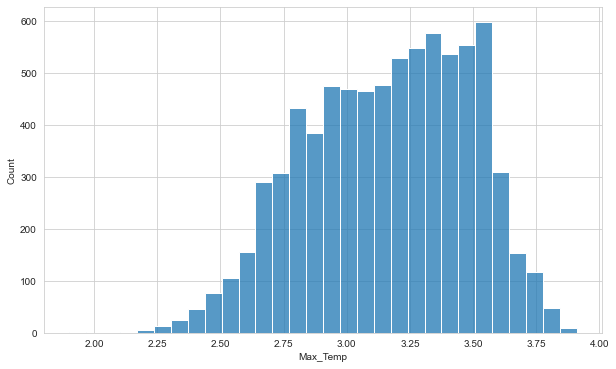

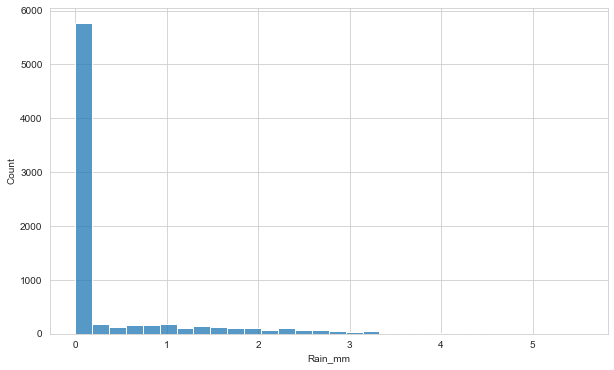

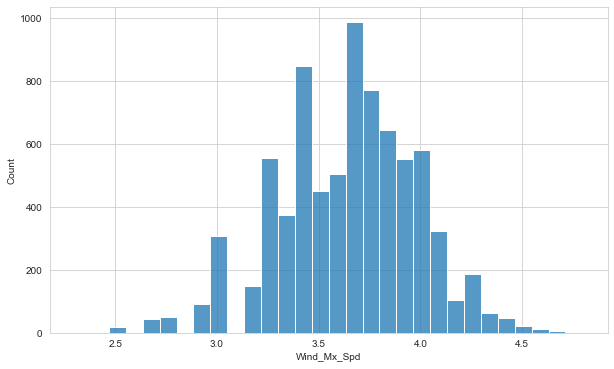

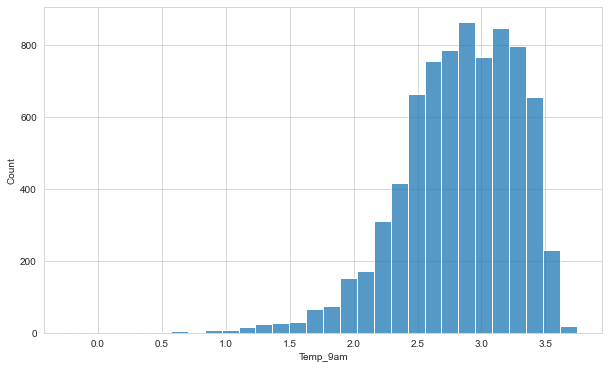

...

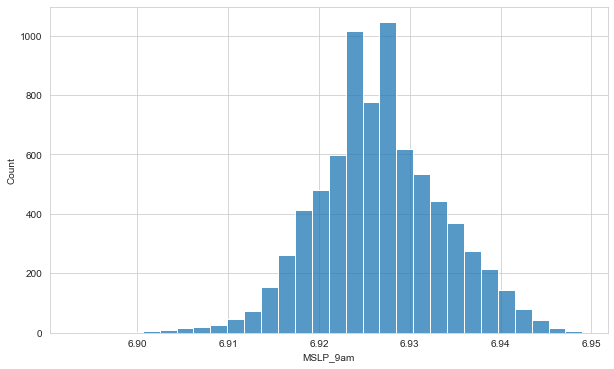

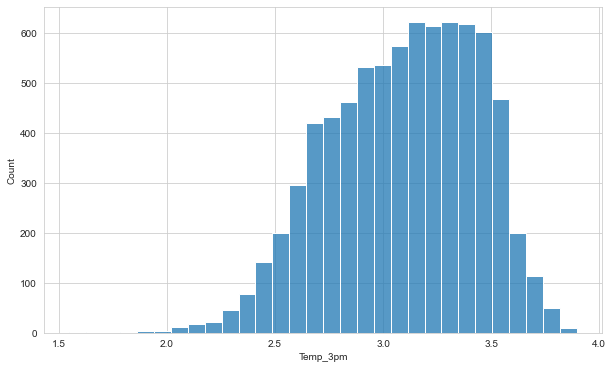

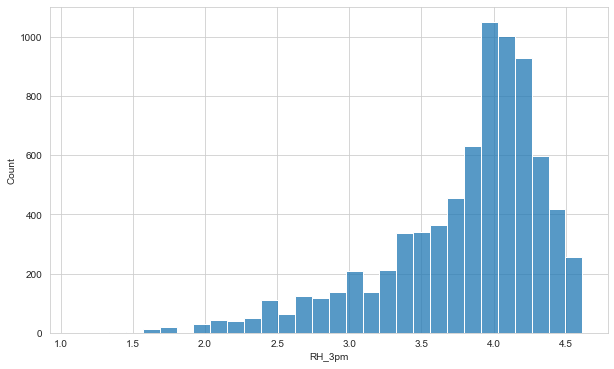

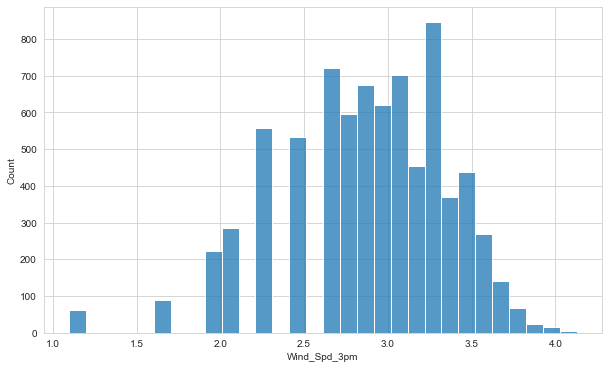

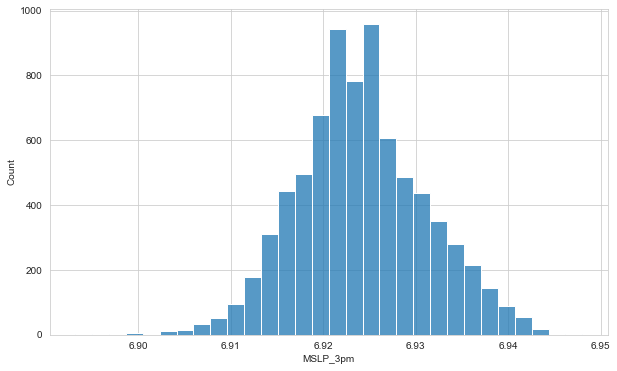

In [421]:
# We can print the histogram again for this features
# Plot the Outcome
for feature in interval:
    sns.set_style("whitegrid")
    plt.figure(figsize=(10,6))
    sns.histplot(x=feature, data=df_int_Log, bins=30)

3.- Categorical Transformations

In [791]:
# First we identify the features that are not on the interval list
categorical = []
for x in df_clean.columns:
    if x not in interval:
        categorical.append(x)

print(categorical)

# Now we will separate the features by Nominal and Ordinal that it will be required
nominal_cat = ["State", "Station", "Wind_Mx_Dir", "Wind_Dir_9am", "Wind_Dir_3pm", "Rain"]
ordinal_cat = ["Year", "Month", "Date", "Day", "Wind_Mx_Tim"]

df_clean[categorical]

['State', 'Station', 'Year', 'Month', 'Date', 'Day', 'Wind_Mx_Dir', 'Wind_Mx_Tim', 'Wind_Dir_9am', 'Wind_Dir_3pm', 'Rain']


,State,Station,Year,Month,Date,Day,Wind_Mx_Dir,Wind_Mx_Tim,Wind_Dir_9am,Wind_Dir_3pm,Rain
9266,WA,Broome Airport {station 003003},2019,May,1,We,NW,16.0,SE,W,N
6840,SA,Renmark Aero {station 024048},2020,April,29,We,WSW,7.0,WSW,W,Y
3713,VIC,Albury Airport AWS {station 072160},2019,July,12,Fr,NNW,19.0,NNW,NW,Y
11612,NT,Tennant Creek Airport {station 015135},2019,December,10,Tu,NNE,1.0,NNW,E,N
5065,QLD,Townsville Aero {station 032040},2020,June,4,Th,SE,13.0,SSW,SE,N
...,...,...,...,...,...,...,...,...,...,...,...
8631,WA,Kalgoorlie-Boulder Airport {station 012038},2019,December,4,We,S,19.0,NNW,N,N
9818,TAS,Launceston (Ti Tree Bend) {station 091237},2020,March,8,Su,NW,15.0,SE,SSE,N
10859,NT,Darwin Airport {station 014015},2019,September,15,Su,E,10.0,ESE,NE,N
4041,VIC,Bendigo Airport {station 081123},2019,October,10,Th,S,14.0,SSE,SSE,N


In [792]:
# Before transforming the features, I will make a copy from the clean data frame and we will work with a new transformed DF
df_cat_trans = df_clean[categorical].copy()

In [793]:
# We start with the Nominal features as is easier to encode
le = preprocessing.LabelEncoder()

# Transform categorical variables
for col in nominal_cat:
   df_cat_trans[col] = le.fit_transform(df_cat_trans[col])

In [794]:
# Now we need to create a dictionay for the Ordinal encoding categories
Wind_Mx_Tim = df_cat_trans[ordinal_cat].Wind_Mx_Tim.unique().tolist()
Wind_Mx_Tim.sort()

# Create dictionary
dictionry_ordinal = {
    "Month": [["January", "February", "March", "April", "May", "June", 
              "July", "August", "September", "October", "November", "December"]],
    "Day": [["Mo", "Tu", "We", "Th", "Fr", "Sa", "Su"]],
    "Year": [[2019, 2020]],
    "Date": [[i for i in range(1, 32)]],
    "Wind_Mx_Tim": [Wind_Mx_Tim]
    }


In [795]:
# Create a for loop that iterates 'dictionry_ordinal' and transform each column into ordinal type
for key, values in dictionry_ordinal.items():
  df_cat_trans[key] = OrdinalEncoder(categories=values).fit_transform(df_cat_trans[[key]])

In [800]:
# Let's have a look at our transformed DF
df_cat_trans

# We could ad a +1 if we don't want to include the 0 as value

,State,Station,Year,Month,Date,Day,Wind_Mx_Dir,Wind_Mx_Tim,Wind_Dir_9am,Wind_Dir_3pm,Rain
9266,7,7,0.0,4.0,0.0,2.0,7,16.0,10,14,0
6840,4,20,1.0,3.0,28.0,2.0,15,7.0,16,14,1
3713,6,1,0.0,6.0,11.0,4.0,6,19.0,7,8,1
11612,2,22,0.0,11.0,9.0,1.0,5,1.0,7,1,0
5065,3,23,1.0,5.0,3.0,3.0,9,13.0,12,10,0
...,...,...,...,...,...,...,...,...,...,...,...
8631,7,14,0.0,11.0,3.0,2.0,8,19.0,7,4,0
9818,5,25,1.0,2.0,7.0,6.0,7,15.0,10,11,0
10859,2,10,0.0,8.0,14.0,6.0,0,10.0,3,5,0
4041,6,5,0.0,9.0,9.0,3.0,8,14.0,11,11,0


4.- Normalization

In [801]:
# Now we are goint to work again with our original Interval values, what we are going to do is to normalizae each of the features
# We create a new data frame that will be normalised
df_int_norm = df_clean[interval].copy()

In [802]:
# We will normalize using the Min-Max from a scale of [0, 1] 
min_max_scaler = preprocessing.MinMaxScaler()

# Loop to transform each feature
for col in df_int_norm:
    df_int_norm[col] = min_max_scaler.fit_transform(df_int_norm[[col]])

In [803]:
# Let's have a look at our Df 
df_int_norm

,Min_Temp,Max_Temp,Rain_mm,Wind_Mx_Spd,Temp_9am,RH_9am,Wind_Spd_9am,MSLP_9am,Temp_3pm,RH_3pm,Wind_Spd_3pm,MSLP_3pm
9266,0.728767,0.678241,0.000000,0.153153,0.710843,0.385417,0.211538,0.469965,0.644944,0.387755,0.288136,0.411871
6840,0.531507,0.219907,0.030612,0.216216,0.342169,0.916667,0.288462,0.416961,0.220225,0.887755,0.186441,0.402878
3713,0.389041,0.157407,0.008634,0.405405,0.253012,0.906250,0.326923,0.505300,0.191011,0.836735,0.406780,0.447842
11612,0.920548,0.849537,0.000000,0.405405,0.850602,0.218750,0.173077,0.452297,0.853933,0.081633,0.305085,0.392086
5065,0.468493,0.453704,0.000000,0.288288,0.453012,0.406250,0.134615,0.674912,0.467416,0.489796,0.372881,0.629496
...,...,...,...,...,...,...,...,...,...,...,...,...
8631,0.742466,0.787037,0.000000,0.450450,0.797590,0.052083,0.288462,0.503534,0.800000,0.071429,0.305085,0.458633
9818,0.374247,0.303241,0.000000,0.316667,0.298795,0.708333,0.250000,0.544523,0.321348,0.408163,0.186441,0.524101
10859,0.695890,0.615741,0.000000,0.387387,0.643373,0.354167,0.288462,0.572438,0.626966,0.255102,0.305085,0.496403
4041,0.317808,0.284722,0.000000,0.234234,0.269880,0.666667,0.288462,0.703180,0.292135,0.438776,0.254237,0.669065


5.- Binning Data

In [836]:
# We are going to choose an Interval feature to convert to a categorical variable
# I'm goning to work with Temperatures
df_cat_temp = df_clean[["Min_Temp", "Max_Temp", "Temp_9am", "Temp_3pm"]].copy()

# I want the width of the ranges to be as close to 5C, for that we follow the formula: Width = (maximum value - minimum value) / N
for cat in df_cat_temp:
    bins = int(round((df_clean[cat].max() - df_clean[cat].min())/5, 0))
    df_cat_temp[cat] = pd.cut(df_clean[cat], bins, labels = False) # For ML labels = False

# Let's have a look
df_cat_temp

# For the propose of this part I'm leaving the data with integers as increasing value as this is now an oridnal feature

,Min_Temp,Max_Temp,Temp_9am,Temp_3pm
9266,5,6,5,5
6840,3,1,2,1
3713,2,1,2,1
11612,6,7,6,7
5065,3,4,3,4
...,...,...,...,...
8631,5,7,6,7
9818,2,2,2,2
10859,4,5,5,5
4041,2,2,2,2


6.- Feature Selection

In [837]:
# First we need to join our categorical transformed DF to our normalized interval DF 
df_clean_trans = df_cat_trans.join(df_int_norm)

# Let's see what we have
df_clean_trans

,State,Station,Year,Month,Date,Day,Wind_Mx_Dir,Wind_Mx_Tim,Wind_Dir_9am,Wind_Dir_3pm,...,Rain_mm,Wind_Mx_Spd,Temp_9am,RH_9am,Wind_Spd_9am,MSLP_9am,Temp_3pm,RH_3pm,Wind_Spd_3pm,MSLP_3pm
9266,7,7,0.0,4.0,0.0,2.0,7,16.0,10,14,...,0.000000,0.153153,0.710843,0.385417,0.211538,0.469965,0.644944,0.387755,0.288136,0.411871
6840,4,20,1.0,3.0,28.0,2.0,15,7.0,16,14,...,0.030612,0.216216,0.342169,0.916667,0.288462,0.416961,0.220225,0.887755,0.186441,0.402878
3713,6,1,0.0,6.0,11.0,4.0,6,19.0,7,8,...,0.008634,0.405405,0.253012,0.906250,0.326923,0.505300,0.191011,0.836735,0.406780,0.447842
11612,2,22,0.0,11.0,9.0,1.0,5,1.0,7,1,...,0.000000,0.405405,0.850602,0.218750,0.173077,0.452297,0.853933,0.081633,0.305085,0.392086
5065,3,23,1.0,5.0,3.0,3.0,9,13.0,12,10,...,0.000000,0.288288,0.453012,0.406250,0.134615,0.674912,0.467416,0.489796,0.372881,0.629496
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8631,7,14,0.0,11.0,3.0,2.0,8,19.0,7,4,...,0.000000,0.450450,0.797590,0.052083,0.288462,0.503534,0.800000,0.071429,0.305085,0.458633
9818,5,25,1.0,2.0,7.0,6.0,7,15.0,10,11,...,0.000000,0.316667,0.298795,0.708333,0.250000,0.544523,0.321348,0.408163,0.186441,0.524101
10859,2,10,0.0,8.0,14.0,6.0,0,10.0,3,5,...,0.000000,0.387387,0.643373,0.354167,0.288462,0.572438,0.626966,0.255102,0.305085,0.496403
4041,6,5,0.0,9.0,9.0,3.0,8,14.0,11,11,...,0.000000,0.234234,0.269880,0.666667,0.288462,0.703180,0.292135,0.438776,0.254237,0.669065


In [807]:
# First let's run a correlation analysis and find the top absolute values
df_clean_trans.corr()["Rain"].abs().sort_values(ascending=False)



In [812]:
# Now we are going to use the SKB feature selection
# First we need to separate the DF on X, y
X = df_clean_trans.drop("Rain", axis=1)
y = df_clean_trans["Rain"]

# Initialise the SelectKBest, for this case we will use the chi2
skb =  SelectKBest(score_func=chi2, k="all")

# Fit the SelectKBest
skb_chi2 = skb.fit(X, y)

# Get the features in a data fram
feat_imp_skb_chi2 = pd.DataFrame(
    {'feature': X.columns[skb_chi2.get_support()].values,
     'importance': skb_chi2.scores_
     }
     )

# See results
feat_imp_skb_chi2.sort_values('importance', ascending=False)

,feature,importance
8,Wind_Dir_9am,680.996767
6,Wind_Mx_Dir,652.290854
9,Wind_Dir_3pm,506.105212
3,Month,193.177102
19,RH_3pm,121.574225
12,Rain_mm,121.170144
15,RH_9am,101.654326
4,Date,80.431399
7,Wind_Mx_Tim,74.472127
11,Max_Temp,54.575911


In [815]:
# Now we will use the mutual_info_classif
skb =  SelectKBest(score_func=mutual_info_classif, k="all")

# Fit the SelectKBest
skb_mutual_info =  skb.fit(X, y)

# Get the features in a data fram
feat_imp_skb_Minf = pd.DataFrame(
    {'feature': X.columns[skb_mutual_info.get_support()].values,
     'importance': skb_mutual_info.scores_
     }
     )

# See results
feat_imp_skb_Minf.sort_values('importance', ascending=False)

,feature,importance
12,Rain_mm,0.606737
15,RH_9am,0.098886
19,RH_3pm,0.086710
18,Temp_3pm,0.056091
11,Max_Temp,0.053665
1,Station,0.035251
9,Wind_Dir_3pm,0.025576
0,State,0.024823
14,Temp_9am,0.024137
8,Wind_Dir_9am,0.022597


In [818]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import SelectFromModel

# From the last two SKB selections, we can see that:
# chi2 is better at getting the categorical features
# mutual_info_classif is better at getting the interval features

# I'm going to use a different option by running a Decision Tree and finding which featrues it selecs
clf = DecisionTreeClassifier()
selector = SelectFromModel(clf, threshold='median')
selector.fit(X, y)

# Get the features in a data fram
feat_imp_fromMod = pd.DataFrame(
    {'feature': X.columns,
     'importance': selector.estimator_.feature_importances_
     }
     )

# See results
temp = feat_imp_fromMod.sort_values('importance', ascending=False)

temp.to_csv("temp.csv", index=True)

# More of a mix, but this is what it will be suitable for a Decision Tree model, if we use a different model different features will be selected

7.- Scattered Plots

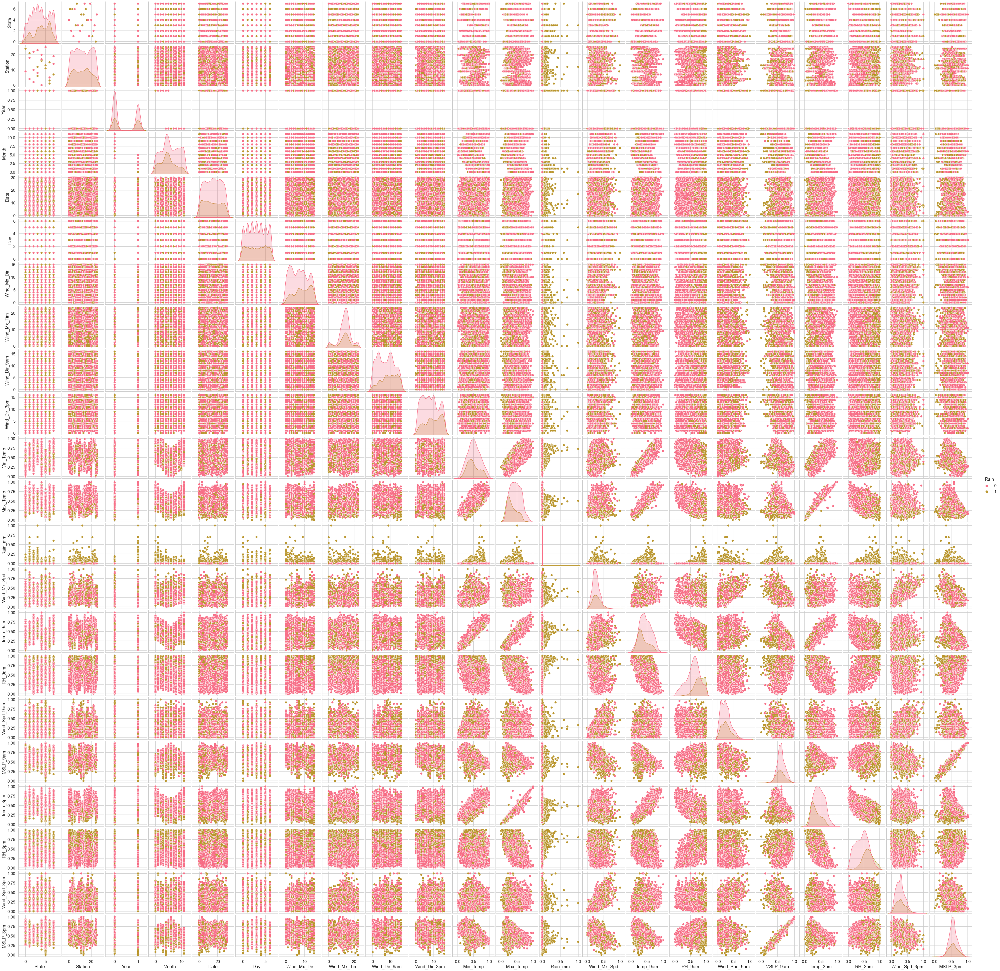

In [820]:
# First we are going to plot all features and try to identify the more relevant 
sns.pairplot(df_clean_trans, hue='Rain')

In [819]:
# First we are going to choose the top 3 and bottom 3 features from the "Mutual_Info_Clasifier"
top3_bot3 = feat_imp_skb_Minf.sort_values('importance', ascending=False).feature.values[[0,1,2,-3,-2,-1]].tolist()

# We add Rain as outcome
top3_bot3.append("Rain")

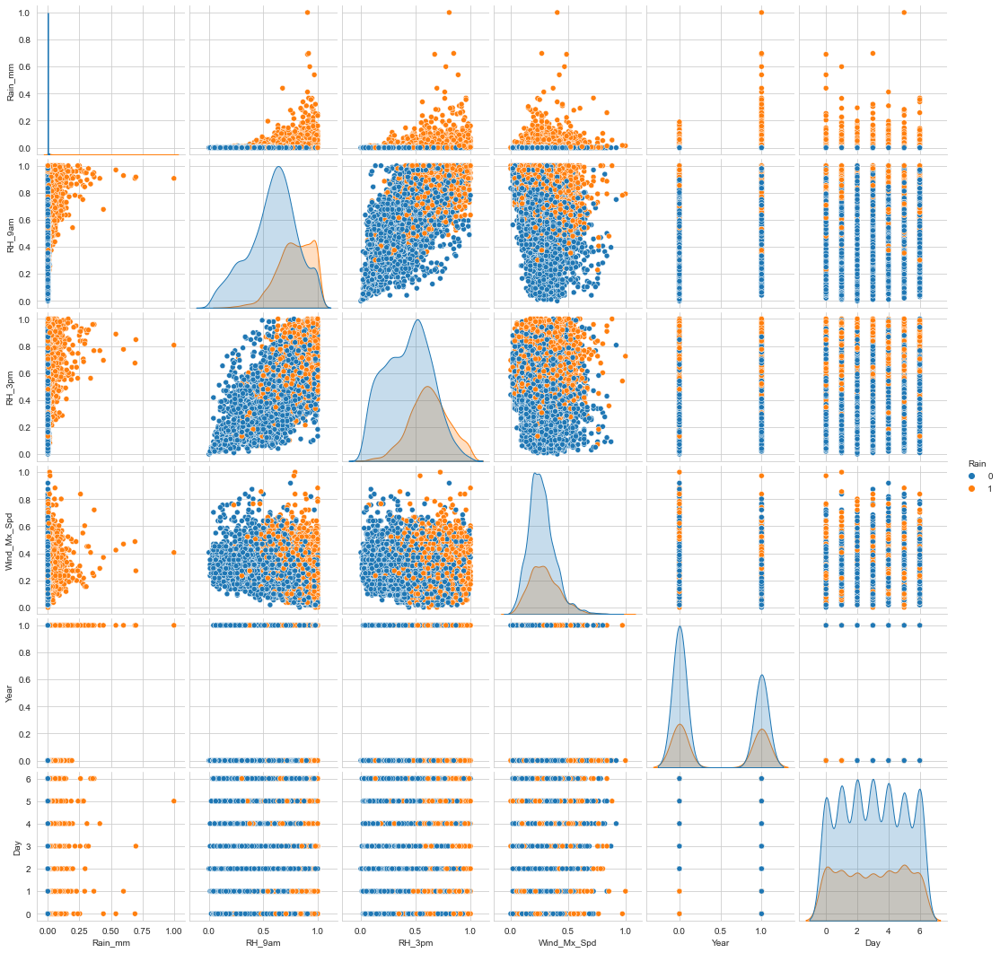

In [577]:
# Create a Scatter plot for the top 3 and bottom 3 features from our previous selection
sns.pairplot(df_clean_trans[top3_bot3], hue='Rain')

8.- Correlation Map

<AxesSubplot:>

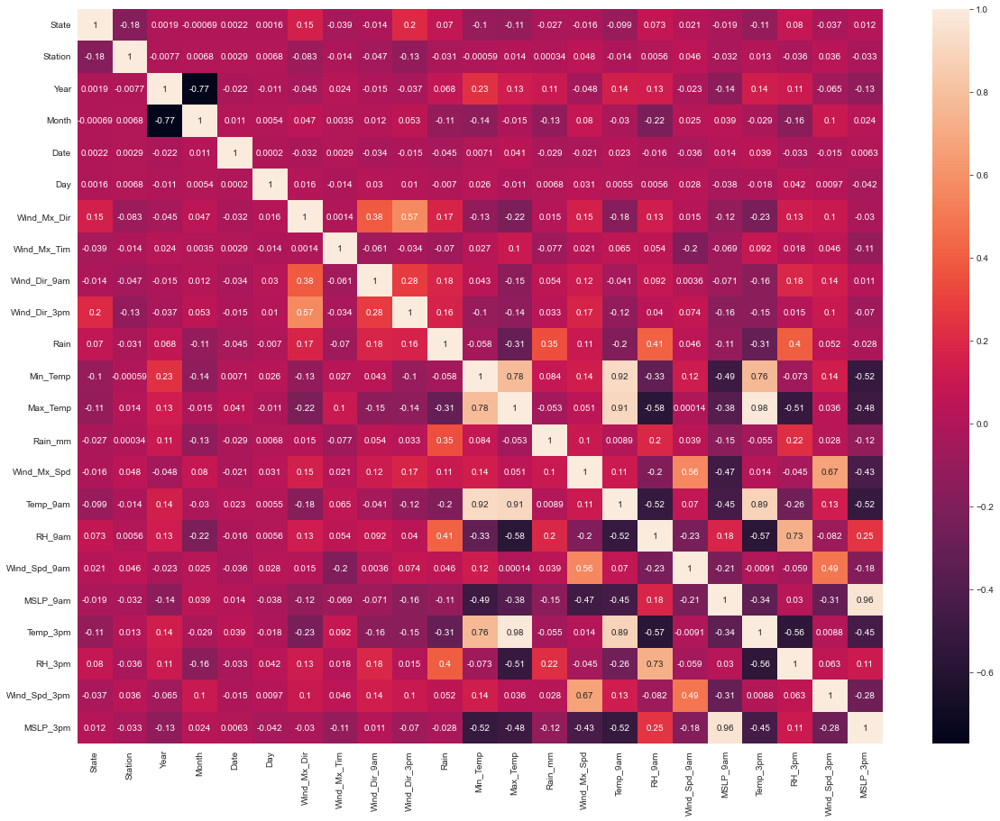

In [581]:
# Correlation among variables
plt.figure(figsize=(20,15))
sns.heatmap(df_clean_trans.corr(), annot=True)

9.- Export Data 

In [838]:
# First we need the categorical features we created from the interval range.
# I'm leaving this features with the binning range as values 
df_clean_trans = df_clean_trans.join(df_cat_temp.add_suffix("_cat"))

# Now we save the clean DF
df_clean_trans.to_csv("ManuelAlvarez_Project1.csv", index=True)